# Prueba técnica Servinformación

El objetivo de este proyecto es mostrar y aplicar algunas habilidades en el área de ciencia de datos, con enfoque en la aplicación de modelos de Machine Learning.

# Extracción - Transformación - Carga y Análisis Exploratorio.

## Dataset Airbnb

Este dataset contiene la siguiente información:

| Columna                  | Descripción                                                                                      | Columna                  | Descripción                                                                                      |
|--------------------------|--------------------------------------------------------------------------------------------------|--------------------------|--------------------------------------------------------------------------------------------------|
| `id`                     | Identificador único de la propiedad                                                              | `city`                   | Ciudad donde se encuentra la propiedad                                                           |
| `log_price`              | Logaritmo del precio de la propiedad                                                             | `description`            | Descripción de la propiedad                                                                      |
| `property_type`          | Tipo de propiedad (e.g., apartamento, casa, etc.)                                                | `first_review`           | Fecha de la primera reseña recibida                                                              |
| `room_type`              | Tipo de habitación ofrecida (e.g., habitación privada, compartida, etc.)                         | `host_has_profile_pic`   | Indica si el anfitrión tiene una foto de perfil (sí/no)                                          |
| `amenities`              | Lista de comodidades disponibles en la propiedad                                                 | `host_identity_verified` | Indica si la identidad del anfitrión ha sido verificada (sí/no)                                   |
| `accommodates`           | Número de personas que la propiedad puede alojar                                                 | `host_response_rate`     | Tasa de respuesta del anfitrión                                                                  |
| `bathrooms`              | Número de baños en la propiedad                                                                  | `host_since`             | Fecha desde la cual el anfitrión ha estado activo en la plataforma                               |
| `bed_type`               | Tipo de cama (e.g., cama doble, cama individual, etc.)                                           | `instant_bookable`       | Indica si la propiedad se puede reservar de manera instantánea (sí/no)                           |
| `cancellation_policy`    | Política de cancelación aplicable a la reserva                                                   | `last_review`            | Fecha de la última reseña recibida                                                               |
| `cleaning_fee`           | Tarifa de limpieza aplicada a la propiedad                                                       | `latitude`               | Latitud de la ubicación de la propiedad                                                          |
| `longitude`              | Longitud de la ubicación de la propiedad                                                         | `name`                   | Nombre de la propiedad                                                                           |
| `neighbourhood`          | Vecindario donde se encuentra la propiedad                                                       | `number_of_reviews`      | Número total de reseñas recibidas por la propiedad                                               |
| `review_scores_rating`   | Puntuación promedio de las reseñas                                                               | `thumbnail_url`          | URL de la imagen en miniatura de la propiedad                                                    |
| `zipcode`                | Código postal de la ubicación de la propiedad                                                    | `bedrooms`               | Número de dormitorios en la propiedad                                                            |
| `beds`                   | Número de camas disponibles en la propiedad                                                      |                          |                                                                                                  |


El objetivo de este proyecto es predecir el precio de las propiedades en alquiler de XXXX, a través de una análisis exploratorio de los datos y la aplicación de varios modelos de Machine Learning y luego su respectiva comparación para obtener el modelo con el mejor comportamiento. 

### Importar librerías necesarias

In [1]:
# Importamos librerías
import kaggle
import zipfile
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import plotly.graph_objs as go
import seaborn as sns
from collections import Counter
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import r2_score, accuracy_score
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
import joblib
import utils as ut
import nbformat

## Extracción del dataset a través de la API de Kaggle

Antes de hacer la extracción es necesario que configures las Credenciales de Kaggle.

In [2]:
!kaggle datasets download -d paramvir705/airbnb-data # Descargamos el dataset de Kaggle

Dataset URL: https://www.kaggle.com/datasets/paramvir705/airbnb-data
License(s): Apache 2.0
airbnb-data.zip: Skipping, found more recently modified local copy (use --force to force download)


Dado que se descarga un archivo comprimido .zip, se extrae con el siguiente código:

In [3]:
with zipfile.ZipFile("airbnb-data.zip", "r") as zip_ref:
    zip_ref.extractall("data")  # Extraemos el dataset

## Exploración de dataset

Inicialmente cargamos el dataset

In [4]:
df = pd.read_csv("data/Airbnb_Data.csv")  # Cargamos el dataset

In [5]:
print(df.shape)  # Imprimimos el tamaño del dataset
df.head()  # Mostramos las primeras filas del dataset

(74111, 29)


,id,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,...,latitude,longitude,name,neighbourhood,number_of_reviews,review_scores_rating,thumbnail_url,zipcode,bedrooms,beds
0,6901257,5.010635,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",3,1.0,Real Bed,strict,True,...,40.696524,-73.991617,Beautiful brownstone 1-bedroom,Brooklyn Heights,2,100.0,https://a0.muscache.com/im/pictures/6d7cbbf7-c...,11201,1.0,1.0
1,6304928,5.129899,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",7,1.0,Real Bed,strict,True,...,40.766115,-73.989040,Superb 3BR Apt Located Near Times Square,Hell's Kitchen,6,93.0,https://a0.muscache.com/im/pictures/348a55fe-4...,10019,3.0,3.0
2,7919400,4.976734,Apartment,Entire home/apt,"{TV,""Cable TV"",""Wireless Internet"",""Air condit...",5,1.0,Real Bed,moderate,True,...,40.808110,-73.943756,The Garden Oasis,Harlem,10,92.0,https://a0.muscache.com/im/pictures/6fae5362-9...,10027,1.0,3.0
3,13418779,6.620073,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1.0,Real Bed,flexible,True,...,37.772004,-122.431619,Beautiful Flat in the Heart of SF!,Lower Haight,0,NaN,https://a0.muscache.com/im/pictures/72208dad-9...,94117.0,2.0,2.0
4,3808709,4.744932,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",2,1.0,Real Bed,moderate,True,...,38.925627,-77.034596,Great studio in midtown DC,Columbia Heights,4,40.0,NaN,20009,0.0,1.0


Para el análisis exploratorio haré uso del Script utils.py donde tengo predefinidas algunas funciones para visualizar la información de nulos, duplicados, etc con una mayor claridad

### Verificamos nulos y tipos de datos

In [6]:
ut.verificar_tipo_datos_y_nulos(
    df
)  # Verificamos los tipos de datos y nulos del dataset

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
15,host_response_rate,"[<class 'float'>, <class 'str'>]",75.31,24.69,18299
24,review_scores_rating,[<class 'float'>],77.44,22.56,16722
12,first_review,"[<class 'str'>, <class 'float'>]",78.59,21.41,15864
18,last_review,"[<class 'str'>, <class 'float'>]",78.64,21.36,15827
25,thumbnail_url,"[<class 'str'>, <class 'float'>]",88.91,11.09,8216
22,neighbourhood,"[<class 'str'>, <class 'float'>]",90.73,9.27,6872
26,zipcode,"[<class 'str'>, <class 'float'>]",98.70,1.30,966
6,bathrooms,[<class 'float'>],99.73,0.27,200
14,host_identity_verified,"[<class 'str'>, <class 'float'>]",99.75,0.25,188
16,host_since,"[<class 'str'>, <class 'float'>]",99.75,0.25,188


Conclusiones
* Se identifican las columnas con menor relevancia para el modelo de predicción, las cuales son:
  * id -> Porque es un identificador único (Sirve para otros análisis, pero no para el modelo).
  * reviews -> Todas las columnas referentes a Reviews serán eliminadas ya que nuestro objetivo es un modelo de predicción de precios, más no un modelo de recomendación basado en la experiencia de los usuarios. El precio precio no cambia, basados en los comentarios de las personas.
  * thumbnail_url	-> Esta columna contiene un link de una imagen. No influye en el modelo.
  * Host response rate -> Que el anfitrión responda rápido o no, no influye en el valor del alquiler.
  * zipcode -> Otro identificador que bo afectaría el modelo.
  * host_since -> No influye en el modelo la antigüedad del host
* Se observan datos nulos los cuales se hará una revisión más detallada para saber si imputar o eliminar

### Dataset definitivo

In [7]:
df_definitivo = df[
    [
        "log_price",
        "property_type",
        "room_type",
        "accommodates",
        "amenities",
        "bathrooms",
        "bed_type",
        "cancellation_policy",
        "cleaning_fee",
        "city",
        "instant_bookable",
        "host_has_profile_pic",
        "host_identity_verified",
        "latitude",
        "longitude",
        "name",
        "neighbourhood",
        "number_of_reviews",
        "bedrooms",
        "beds",
    ]
]  # Seleccionamos las columnas que consideramos relevantes

Volvemos a observar el dataset y su tamaño

In [8]:
print(df_definitivo.shape)  # Imprimimos el tamaño del dataset
df_definitivo.head()  # Mostramos las primeras filas del dataset

(74111, 20)


,log_price,property_type,room_type,accommodates,amenities,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,instant_bookable,host_has_profile_pic,host_identity_verified,latitude,longitude,name,neighbourhood,number_of_reviews,bedrooms,beds
0,5.010635,Apartment,Entire home/apt,3,"{""Wireless Internet"",""Air conditioning"",Kitche...",1.0,Real Bed,strict,True,NYC,f,t,t,40.696524,-73.991617,Beautiful brownstone 1-bedroom,Brooklyn Heights,2,1.0,1.0
1,5.129899,Apartment,Entire home/apt,7,"{""Wireless Internet"",""Air conditioning"",Kitche...",1.0,Real Bed,strict,True,NYC,t,t,f,40.766115,-73.989040,Superb 3BR Apt Located Near Times Square,Hell's Kitchen,6,3.0,3.0
2,4.976734,Apartment,Entire home/apt,5,"{TV,""Cable TV"",""Wireless Internet"",""Air condit...",1.0,Real Bed,moderate,True,NYC,t,t,t,40.808110,-73.943756,The Garden Oasis,Harlem,10,1.0,3.0
3,6.620073,House,Entire home/apt,4,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",1.0,Real Bed,flexible,True,SF,f,t,t,37.772004,-122.431619,Beautiful Flat in the Heart of SF!,Lower Haight,0,2.0,2.0
4,4.744932,Apartment,Entire home/apt,2,"{TV,Internet,""Wireless Internet"",""Air conditio...",1.0,Real Bed,moderate,True,DC,t,t,t,38.925627,-77.034596,Great studio in midtown DC,Columbia Heights,4,0.0,1.0


Se observa que `amenities` se encuentra dentro de un set

Verificamos nuevamente los nulos con las columnas a utilizar

In [9]:
ut.verificar_tipo_datos_y_nulos(df_definitivo)  # Verificamos los tipos de datos y nulos

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
16,neighbourhood,"[<class 'str'>, <class 'float'>]",90.73,9.27,6872
5,bathrooms,[<class 'float'>],99.73,0.27,200
11,host_has_profile_pic,"[<class 'str'>, <class 'float'>]",99.75,0.25,188
12,host_identity_verified,"[<class 'str'>, <class 'float'>]",99.75,0.25,188
19,beds,[<class 'float'>],99.82,0.18,131
18,bedrooms,[<class 'float'>],99.88,0.12,91
17,number_of_reviews,[<class 'int'>],100.00,0.00,0
15,name,[<class 'str'>],100.00,0.00,0
14,longitude,[<class 'float'>],100.00,0.00,0
13,latitude,[<class 'float'>],100.00,0.00,0


Conclusiones
* Se imputará Neighbourhood con ayuda de la geolocalización para hallar el vecindario más cercano al sitio de alquiler.
* Dado que los valores nulos no son representativos, es decir menores al 1% se decide eliminar, adicionalmente, es difícil imputar acerca de los alquileres, sin tener una seguridad de que existan el número de baños correctos o habitaciones, etc.

### Imputación Neighbourhood

Como se hará uso de la longitud y latitud, se verifica que no tengan valores nulos

In [10]:
df_neighbourhood = df_definitivo[
    ["latitude", "longitude", "neighbourhood"]
]  # Creamos un dataframe con las columnas que nos interesan

In [11]:
df_neighbourhood.isna().sum()

latitude            0
longitude           0
neighbourhood    6872
dtype: int64

Uso del modelo KNN para imputar los vecindarios nulos

In [12]:
X_test = df_neighbourhood.loc[df_neighbourhood["neighbourhood"].isna()].drop(
    "neighbourhood", axis=1
)  # Creamos el conjunto de test con las filas que tienen el valor de neighbourhood nulo
df_neighbourhood_not_na = df_neighbourhood.loc[
    ~df_neighbourhood[
        "neighbourhood"
    ].isna()  # Creamos el conjunto de train con las filas que tienen el valor de neighbourhood no nulo
]
X_train, y_train = (
    df_neighbourhood_not_na.drop(["neighbourhood"], axis=1),
    df_neighbourhood_not_na["neighbourhood"],
)  # Separamos las columnas de features y target
nbrs = KNeighborsClassifier(n_neighbors=2)  # Instanciamos el modelo
nbrs.fit(X_train, y_train)  # Ajustamos el modelo
nbrs_pred = nbrs.predict(X_test)  # Predecimos
nbrs_pred = pd.Series(
    nbrs_pred, index=X_test.index
)  # Convertimos el array en una serie
nbrs_pred  # Mostramos las predicciones

6        Marina Del Rey
9           West Covina
14           Long Beach
26            Hollywood
28             Downtown
              ...      
74098         Hollywood
74099         Hollywood
74101      Santa Monica
74104        Gold Coast
74105    West Hollywood
Length: 6872, dtype: object

Ahora se asignan las predicciones a la columna correspondiente al vecindario 

In [13]:
# Suponiendo que df_definitivo tiene el mismo índice que X_test_nbrs
df_definitivo.loc[df_definitivo["neighbourhood"].isna(), "neighbourhood"] = nbrs_pred

Se corrige la columna `amenities` que corresponde a las comodidades dentro del alquiler, se pasa a tipo list

In [14]:
# Definir una pequeña función para limpiar la lista de amenities
def clean_amenities(amenities):
    try:
        # Removemos las llaves y dividir la cadena en elementos separados por comas
        items = amenities.strip("{}").split(",")
        # Removemos las comillas dobles de cada elemento
        cleaned_items = [item.strip('"') for item in items]
        return cleaned_items
    except AttributeError:
        # En caso de que amenities no sea una cadena, retornar el valor original
        return amenities


# Aplicamos la función a la columna "amenities" del DataFrame
df_definitivo["amenities"] = df_definitivo["amenities"].apply(clean_amenities)

/tmp/ipykernel_42015/945402363.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_definitivo["amenities"] = df_definitivo["amenities"].apply(clean_amenities)


Teniendo corregido el dataset, se procede a eliminar los nulos que no fueron imputados

In [15]:
df_definitivo = df_definitivo.dropna()  # Eliminamos los valores nulos

In [16]:
ut.verificar_tipo_datos_y_nulos(df_definitivo)  # Verificamos los tipos de datos y nulos

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,log_price,[<class 'float'>],100.0,0.0,0
1,property_type,[<class 'str'>],100.0,0.0,0
18,bedrooms,[<class 'float'>],100.0,0.0,0
17,number_of_reviews,[<class 'int'>],100.0,0.0,0
16,neighbourhood,[<class 'str'>],100.0,0.0,0
15,name,[<class 'str'>],100.0,0.0,0
14,longitude,[<class 'float'>],100.0,0.0,0
13,latitude,[<class 'float'>],100.0,0.0,0
12,host_identity_verified,[<class 'str'>],100.0,0.0,0
11,host_has_profile_pic,[<class 'str'>],100.0,0.0,0


Ahora se identifican duplicados

In [17]:
num_duplicados = df.duplicated().sum()
print("Número de duplicados:", num_duplicados)

Número de duplicados: 0


### Disminución de características 

Para un mejor comportamiento del modelo, se recomienda reducir el número de características de las variables categóricas, que para el caso de este dataset es tips de propiedades (`property_types`)

In [18]:
# Verificamos la cantidad de tipos
len(df_definitivo["property_type"].value_counts())

34

In [19]:
# Visualizamos la cantidad de los diferentes tipos
df_definitivo["property_type"].value_counts()

property_type
Apartment             48610
House                 16424
Condominium            2650
Townhouse              1683
Loft                   1236
Other                   600
Guesthouse              497
Bed & Breakfast         457
Bungalow                365
Villa                   178
Dorm                    134
Guest suite             123
Camper/RV                93
Timeshare                76
Cabin                    71
In-law                   71
Hostel                   70
Boutique hotel           69
Boat                     65
Serviced apartment       21
Tent                     18
Castle                   13
Vacation home            11
Yurt                      9
Hut                       8
Treehouse                 7
Chalet                    6
Earth House               4
Tipi                      3
Train                     2
Cave                      2
Casa particular           1
Lighthouse                1
Island                    1
Name: count, dtype: int64

Se observa que más del 50% de los tipos de alquiler corresponden al tipo Apartment, se toma la decisión de agrupar los tipos de alquiler con conteo menor a Villa, es decir 178

In [20]:
# Obtenemos el conteo de cada tipo de propiedad
property_counts = df_definitivo["property_type"].value_counts()

# Obtenemos el conteo de "Villa"
villa_count = property_counts.get("Villa", 0)


# Función para reemplazar tipos de propiedad según el criterio especificado
def categorize_property(property_type):
    if property_counts[property_type] < villa_count:
        return "Other"
    return property_type


# Aplicamos la función a la columna "property_type"
df_definitivo["property_type"] = df_definitivo["property_type"].apply(
    categorize_property
)

# Mostramos el conteo de cada tipo de propiedad
print(df_definitivo["property_type"].value_counts())

property_type
Apartment          48610
House              16424
Condominium         2650
Townhouse           1683
Other               1479
Loft                1236
Guesthouse           497
Bed & Breakfast      457
Bungalow             365
Villa                178
Name: count, dtype: int64


Para asegurar la fiabilidad y relevancia del análisis, se define un umbral de frecuencia mínima de 5 observaciones para los vecindarios. Esto se hace con los siguientes objetivos:

1. **Reducción del Ruido**: Vecindarios con menos de 5 listados pueden no ser representativos y podrían introducir ruido en nuestros resultados.
2. **Fiabilidad Estadística**: Con un mínimo de 5 observaciones, aumentamos la fiabilidad de nuestras inferencias estadísticas y reducimos el riesgo de que nuestras conclusiones estén sesgadas por datos esporádicos.
3. **Simplicidad y Eficiencia**: Al enfocarnos solo en los vecindarios con suficientes datos, simplificamos nuestro análisis y optimizamos el uso de recursos computacionales, asegurando un proceso más manejable y eficiente.

Este umbral nos permite centrarnos en los vecindarios que tienen una representación adecuada en nuestros datos, asegurando que nuestros resultados sean robustos y accionables.


In [21]:
# Definimos el umbral de frecuencia mínima
umbral_minimo = 5

# Obtenemos el conteo de cada vecindario
neighbourhood_counts = df_definitivo["neighbourhood"].value_counts()

# Filtramos vecindarios que cumplen con el umbral de frecuencia mínima
frequent_neighbourhoods = neighbourhood_counts[
    neighbourhood_counts >= umbral_minimo
].index

# Filtramos el DataFrame para mantener solo las entradas con vecindarios frecuentes
df_filtered = df_definitivo[
    df_definitivo["neighbourhood"].isin(frequent_neighbourhoods)
].reset_index(drop=True)

In [22]:
print(df_filtered.shape)  # Imprimimos el tamaño del dataset
ut.verificar_tipo_datos_y_nulos(df_filtered)  # Verificamos los tipos de datos y nulos

(73349, 20)


,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,log_price,[<class 'float'>],100.0,0.0,0
1,property_type,[<class 'str'>],100.0,0.0,0
18,bedrooms,[<class 'float'>],100.0,0.0,0
17,number_of_reviews,[<class 'int'>],100.0,0.0,0
16,neighbourhood,[<class 'str'>],100.0,0.0,0
15,name,[<class 'str'>],100.0,0.0,0
14,longitude,[<class 'float'>],100.0,0.0,0
13,latitude,[<class 'float'>],100.0,0.0,0
12,host_identity_verified,[<class 'str'>],100.0,0.0,0
11,host_has_profile_pic,[<class 'str'>],100.0,0.0,0


### Expansión de Amenities

Dado que la columna de Comodidades de los alquileres tiene dentro de su registros listas, es necesario explotar o mejor dicho crear columnas con valores booleanos de si tiene o no cierta comodidad, para la correcta aplicación del modelo.

In [23]:
# Definimos una pequeña función para verificar la presencia de elementos en la lista de comodidades
def has_item(amenities_list, items):
    return any(item in amenities_list for item in items)


# Crear columnas booleanas para cada característica
df_filtered["has_internet"] = df_filtered["amenities"].apply(
    lambda amenities_list: has_item(amenities_list, ["Wireless Internet", "Internet"])
)
df_filtered["has_air_conditioning"] = df_filtered["amenities"].apply(
    lambda amenities_list: "Air conditioning" in amenities_list
)
df_filtered["has_kitchen"] = df_filtered["amenities"].apply(
    lambda amenities_list: "Kitchen" in amenities_list
)
df_filtered["has_cable_tv"] = df_filtered["amenities"].apply(
    lambda amenities_list: has_item(amenities_list, ["TV", "Cable TV"])
)
df_filtered["has_luxuries"] = df_filtered["amenities"].apply(
    lambda amenities_list: has_item(amenities_list, ["Gym", "Hot tub", "Pool"])
)


# Convertir variables booleanas a tipo de datos booleano
df_filtered["instant_bookable"] = df_filtered["instant_bookable"].map(
    {"t": True, "f": False}
)
df_filtered["host_has_profile_pic"] = df_filtered["host_has_profile_pic"].map(
    {"t": True, "f": False}
)
df_filtered["host_identity_verified"] = df_filtered["host_identity_verified"].map(
    {"t": True, "f": False}
)

# Seleccionar columnas booleanas y categóricas
df_bool = df_filtered.select_dtypes(include=np.bool_)
df_categorical = df_filtered.select_dtypes(include=object)

# Seleccionar columnas numéricas
df_numerical = df_filtered.select_dtypes(include=np.number)

# Concatenar las columnas numéricas y booleanas
df_non_categorical = pd.concat([df_numerical, df_bool], axis=1)

Visualizamos los datasets creados

In [24]:
df_non_categorical.head()

,log_price,accommodates,bathrooms,latitude,longitude,number_of_reviews,bedrooms,beds,cleaning_fee,instant_bookable,host_has_profile_pic,host_identity_verified,has_internet,has_air_conditioning,has_kitchen,has_cable_tv,has_luxuries
0,5.010635,3,1.0,40.696524,-73.991617,2,1.0,1.0,True,False,True,True,True,True,True,False,False
1,5.129899,7,1.0,40.766115,-73.989040,6,3.0,3.0,True,True,True,False,True,True,True,False,False
2,4.976734,5,1.0,40.808110,-73.943756,10,1.0,3.0,True,True,True,True,True,True,True,True,False
3,6.620073,4,1.0,37.772004,-122.431619,0,2.0,2.0,True,False,True,True,True,False,True,True,False
4,4.744932,2,1.0,38.925627,-77.034596,4,0.0,1.0,True,True,True,True,True,True,True,True,False


In [25]:
df_categorical.head()

,property_type,room_type,amenities,bed_type,cancellation_policy,city,name,neighbourhood
0,Apartment,Entire home/apt,"[Wireless Internet, Air conditioning, Kitchen,...",Real Bed,strict,NYC,Beautiful brownstone 1-bedroom,Brooklyn Heights
1,Apartment,Entire home/apt,"[Wireless Internet, Air conditioning, Kitchen,...",Real Bed,strict,NYC,Superb 3BR Apt Located Near Times Square,Hell's Kitchen
2,Apartment,Entire home/apt,"[TV, Cable TV, Wireless Internet, Air conditio...",Real Bed,moderate,NYC,The Garden Oasis,Harlem
3,House,Entire home/apt,"[TV, Cable TV, Internet, Wireless Internet, Ki...",Real Bed,flexible,SF,Beautiful Flat in the Heart of SF!,Lower Haight
4,Apartment,Entire home/apt,"[TV, Internet, Wireless Internet, Air conditio...",Real Bed,moderate,DC,Great studio in midtown DC,Columbia Heights


# Ánalisis Exploratorio de Datos (EDA)

Primero vamos a observar las variables categóricas

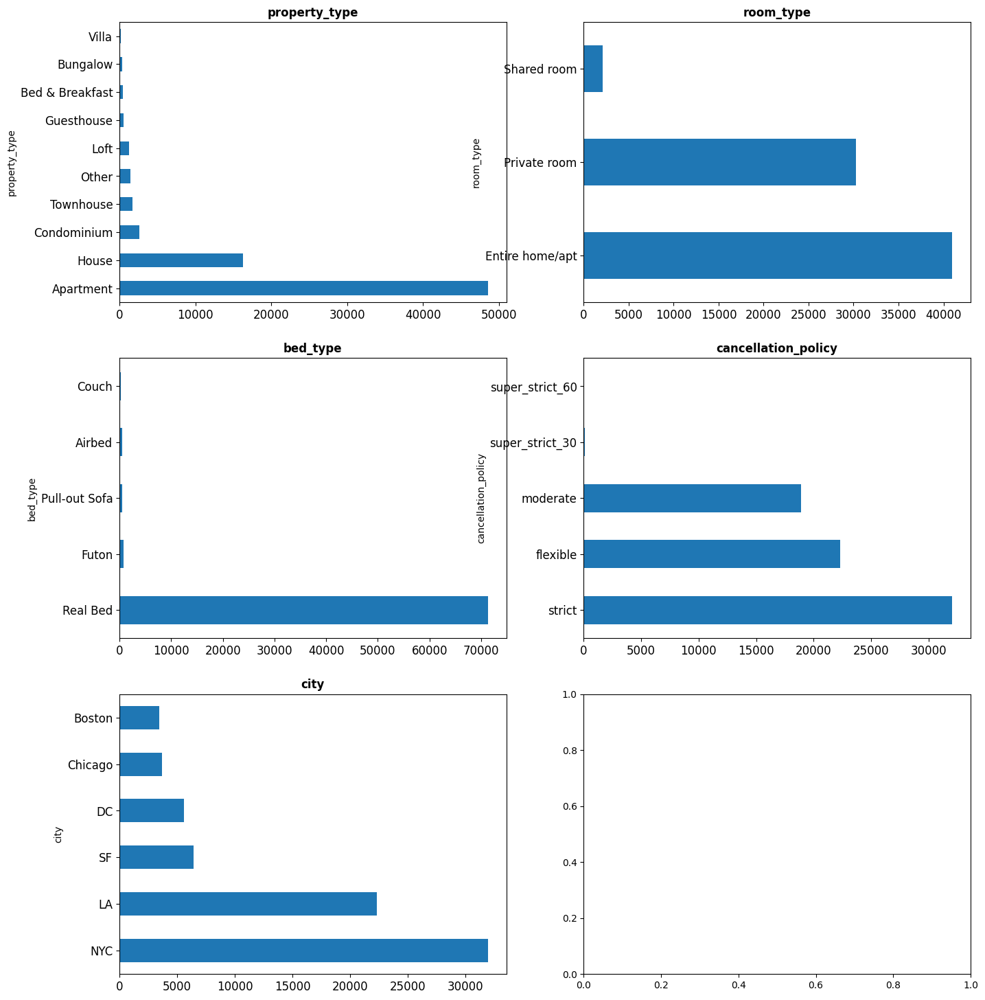

In [26]:
ut.graficos_eda_categoricos(
    df_categorical.select_dtypes("O").drop(
        ["neighbourhood", "amenities", "name"], axis=1
    )
)  # Se seleccionan las columnas cuyo datatype es Object y se excluyen algunas columnas que mostrarían ruido debido a que tienen muchos valores únicos

Conclusiones 
* Bed type solo tendrá dos categorías para refinar el modelo, ya que es predominante la categoría REal Bed, se agrega de la definición Others donde irán la suma de las otras categorías
* Se transforma Super_Strict 60 y 30 a la variable Strict, que es la que más predomina y es el nivel más estricto
* New York es la ciudad con mayor información en el dataset, con más de 30 mil registros

Antes de continuar con el análisis exploratorio, realizamos los cambios mencionados anteriormente

In [27]:
# DF Categorical
# Transformación de la variable "bed_type"
df_categorical["bed_type"] = df_categorical["bed_type"].replace(
    ["Couch", "Futon", "Pull-out Sofa", "Airbed"], "Others"
)

# Transformación de la variable "cancellation_policy"
df_categorical["cancellation_policy"] = df_categorical["cancellation_policy"].replace(
    ["super_strict_60", "super_strict_30"], "strict"
)

# También para DF Filtered

# Transformación de la variable "bed_type"
df_filtered["bed_type"] = df_filtered["bed_type"].replace(
    ["Couch", "Futon", "Pull-out Sofa", "Airbed"], "Others"
)

# Transformación de la variable "cancellation_policy"
df_filtered["cancellation_policy"] = df_filtered["cancellation_policy"].replace(
    ["super_strict_60", "super_strict_30"], "strict"
)

Volvemos a observar la variables categóricas

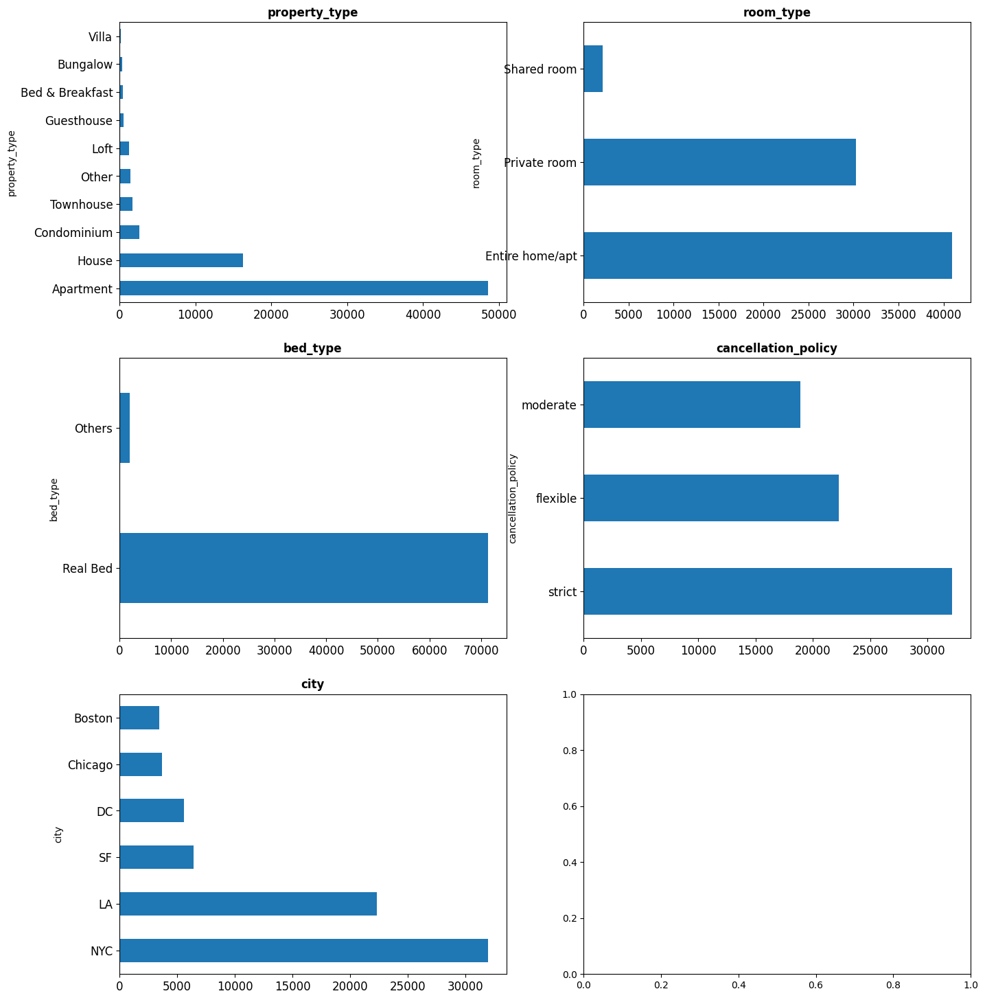

In [28]:
ut.graficos_eda_categoricos(
    df_categorical.select_dtypes("O").drop(
        ["neighbourhood", "amenities", "name"], axis=1
    )
)  # Se seleccionan las columnas cuyo datatype es Object y se excluyen algunas columnas que mostrarían ruido debido a que tienen muchos valores únicos

Variables numéricas

Para las variables numéricas se realizará un análisis de algunos estadísticos importantes.

In [29]:
ut.estadisticos_cont(df_numerical)  # Mostramos estadísticos descriptivos

,count,mean,median,std,min,25%,50%,75%,max
log_price,73349.0,4.783463,4.718499,0.717528,0.000000,4.317488,4.718499,5.220356,7.600402
accommodates,73349.0,3.158802,2.000000,2.152342,1.000000,2.000000,2.000000,4.000000,16.000000
bathrooms,73349.0,1.235620,1.000000,0.581946,0.000000,1.000000,1.000000,1.000000,8.000000
latitude,73349.0,38.437756,40.661900,3.082891,33.338905,34.126081,40.661900,40.746061,42.390437
longitude,73349.0,-92.468874,-76.998653,21.722502,-122.511500,-118.343429,-76.998653,-73.954670,-70.999166
number_of_reviews,73349.0,20.904061,6.000000,37.839647,0.000000,1.000000,6.000000,23.000000,605.000000
bedrooms,73349.0,1.265839,1.000000,0.851870,0.000000,1.000000,1.000000,1.000000,10.000000
beds,73349.0,1.711407,1.000000,1.252347,0.000000,1.000000,1.000000,2.000000,18.000000


Conclusiones
*  La mayoría de los precios se agrupan en torno a 4.72, con una desviación moderada. Esto sugiere que hay una variedad razonable de precios, pero sin valores extremadamente altos o bajos fuera del rango común.
*  La mayoría de las propiedades tienen capacidad para alojar a 2 personas, pero hay propiedades que pueden alojar hasta 16 personas, indicando una diversidad en el tamaño de las propiedades.
*  La mayoría de las propiedades tienen al menos 1 baño.
*  La mayoría de las propiedades tienen relativamente pocas reseñas (mediana de 6), pero algunas propiedades tienen un número muy alto de reseñas, lo que indica alta popularidad o antigüedad en el listado.

### Visualización

A continuación, se muestra un gráfico de dispersión de los distintos alquileres, donde según el color varia el precio del alquiler y el tamaños del círculo indica el número de reseñas del mismo

In [30]:
# Creamos el gráfico de dispersión en un mapa
fig = px.scatter_mapbox(
    df_filtered,
    lat="latitude",
    lon="longitude",
    color="log_price",
    color_continuous_scale=px.colors.cyclical.Phase,
    size="number_of_reviews",
    hover_name="name",
    hover_data=["property_type", "room_type", "neighbourhood"],
)

# Configurar el estilo del mapa
fig.update_layout(
    mapbox_style="open-street-map",
    mapbox_bounds={"west": -160, "east": -50, "south": 20, "north": 90},
    height=800,
    width=1400,
)

# Mostrar el gráfico
fig.show()

Conclusiones
* La mayoría de las ciudades presentan concentración de sus alquileres en las zonas centrales, solo Los Ángeles presenta algo de dispersión en la locación.

Ahora se observan las distribuciones de algunos campos del dataset

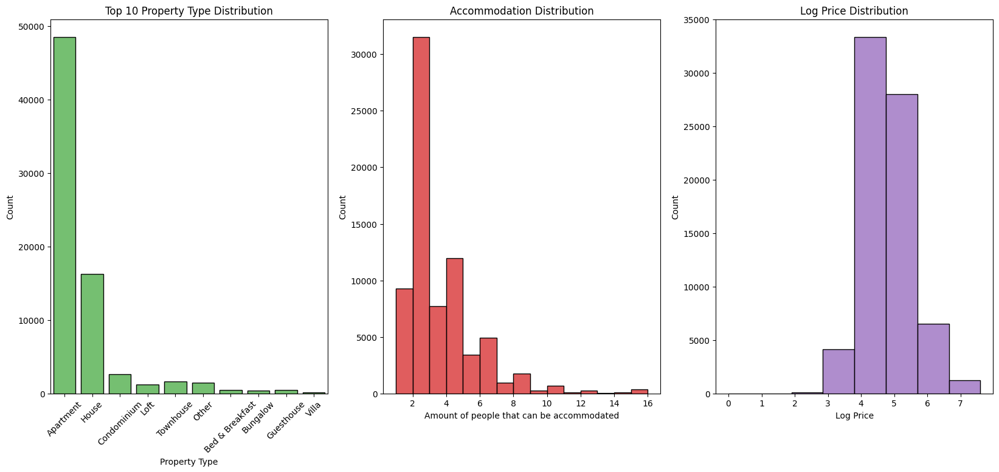

In [31]:
# Creamos la figura y los ejes
fig, ax = plt.subplots(1, 3, figsize=(20, 8))

# Gráfico de barras para la distribución de los 10 primeros tipos de propiedad
top_property_types = df_filtered["property_type"].value_counts().head(10).index
df_top_property_types = df_filtered[
    df_filtered["property_type"].isin(top_property_types)
]
sns.countplot(
    x="property_type",
    data=df_top_property_types,
    color=sns.color_palette("muted")[2],
    edgecolor="black",
    ax=ax[0],
)
ax[0].set_title("Top 10 Property Type Distribution")
ax[0].set_ylabel("Count")
ax[0].set_xlabel("Property Type")
ax[0].tick_params(axis="x", rotation=45)

# Histograma para la distribución de alojamiento
sns.histplot(
    x="accommodates",
    data=df_filtered,
    binwidth=1,
    color=sns.color_palette()[3],
    ax=ax[1],
)
ax[1].set_title("Accommodation Distribution")
ax[1].set_xlabel("Amount of people that can be accommodated")
ax[1].set_ylabel("Count")

# Histograma para la distribución de precios (logaritmo)
sns.histplot(
    data=df_filtered,
    x="log_price",
    edgecolor="black",
    bins=8,
    ax=ax[2],
    color=sns.color_palette()[4],
)
ax[2].set_title("Log Price Distribution")
ax[2].set_xlabel("Log Price")
ax[2].set_ylabel("Count")

# Mostramos el gráfico
plt.show()

Conclusiones
* Más del 50% de los tipos de alquiler corresponden a Apartment, siendo el tipo más común en las ciudades analizadas
* La mayoría de los alquileres pueden alojar al menos dos personas
* La mayoría de los precios se agrupan entre 4 y 5, se nota bastante concentrada en esos dos precios

Ahora vamos a observas la Comodities o Comodidades de los alquileres, así podremos perfil qué es lo más común o mínimo que debería tener un alquiler para ser llamativo

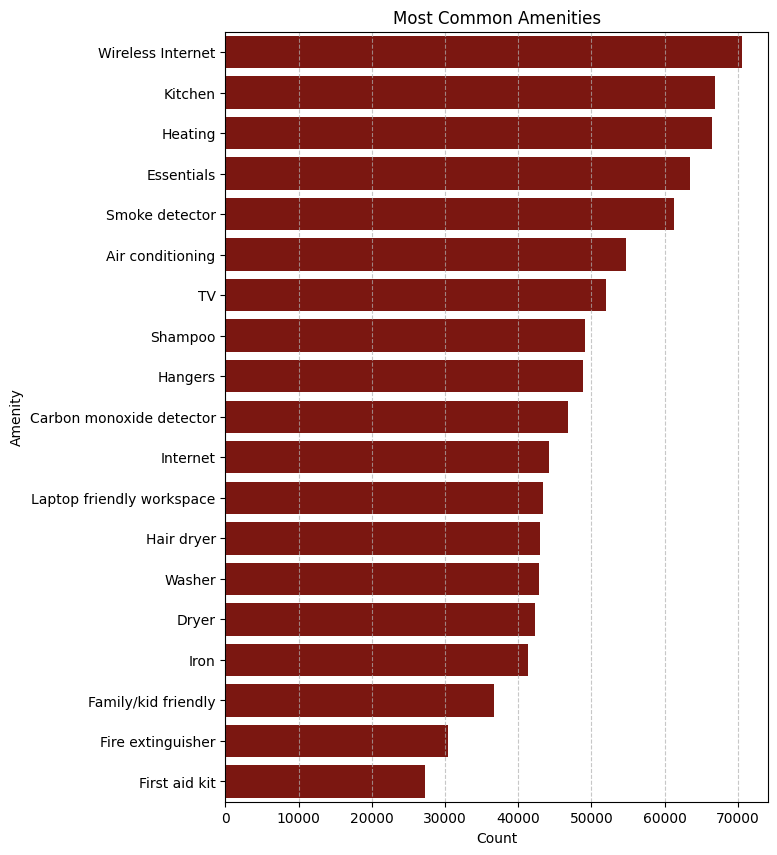

In [32]:
# Contar las comodidades
amenities_count = [item for sublist in df_filtered["amenities"] for item in sublist]
amenities_count = Counter(amenities_count)
df_amenities = (
    pd.DataFrame.from_dict(amenities_count, orient="index", columns=["Count"])
    .reset_index()
    .rename({"index": "Amenity"}, axis=1)
    .sort_values(by="Count", ascending=False)
)

# Número de comodidades a mostrar
NUM_COL = 19
colour = sns.color_palette(palette="dark")[3]

plt.figure(figsize=(7, 10))
sns.barplot(
    y=df_amenities["Amenity"].head(NUM_COL),
    x=df_amenities["Count"].head(NUM_COL),
    color=colour,
)
plt.title("Most Common Amenities")
plt.xlabel("Count")
plt.ylabel("Amenity")
plt.grid(axis="x", linestyle="--", alpha=0.7)

plt.show()

Conclusiones
* Lo más común e indispensable en un alquiler es tener conexión a Internet.
* En segundo lugar, es común que los alquileres presenten una cocina.
* Es indispensable también que los alquileres presenten calefacción, esto por las altas o bajas temperaturas presentes en las ciudades.
* Kit de primeros auxilios no parece ser algo indispensable en los alquileres.

Ahora se realizará un cuadro de correlación para observar un poco más el comportamientos de los datos 

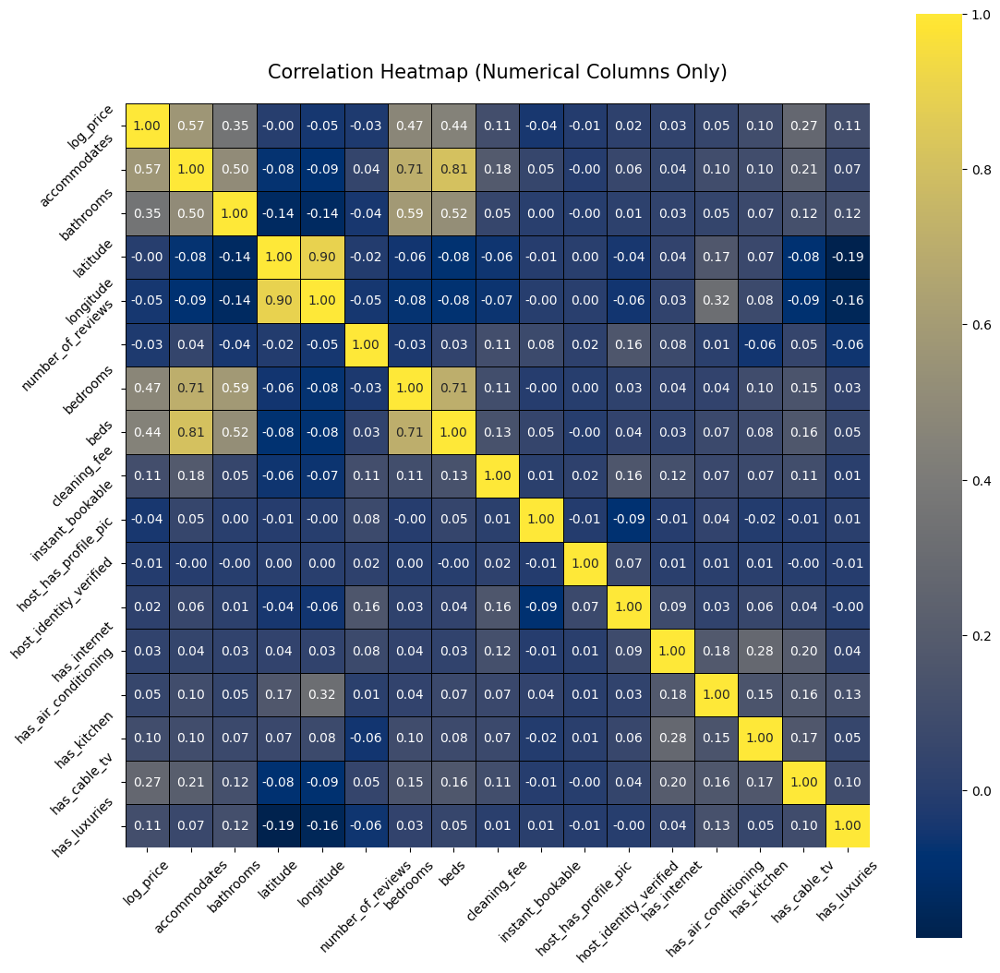

In [33]:
# Creamos el tamaño de la figura
plt.figure(figsize=(13, 13))

# Creamos el mapa de calor de correlación
sns.heatmap(
    df_non_categorical.corr(),  # Utilizar la correlación de las columnas numéricas del DataFrame
    annot=True,  # Mostrar los valores de correlación en las celdas
    cmap="cividis",  # Elegir un esquema de color para el mapa de calor
    fmt=".2f",  # Formato de las anotaciones (dos decimales)
    square=True,  # Hacer que las celdas sean cuadradas
    linewidths=0.5,  # Grosor de las líneas entre las celdas
    linecolor="black",  # Color de las líneas entre las celdas
    annot_kws={"size": 10},  # Ajustar el tamaño de la fuente de las anotaciones
)

# Agregamos título al mapa de calor
plt.title("Correlation Heatmap (Numerical Columns Only)", fontsize=15, pad=20)

# Rotamos las etiquetas del eje x para una mejor visualización
plt.xticks(rotation=45)

# Rotamos las etiquetas del eje y para una mejor visualización
plt.yticks(rotation=45)

# Mostramos el mapa de calor
plt.show()

Acotamos a 0.45 para tener una mejor visión de las  correlaciones 

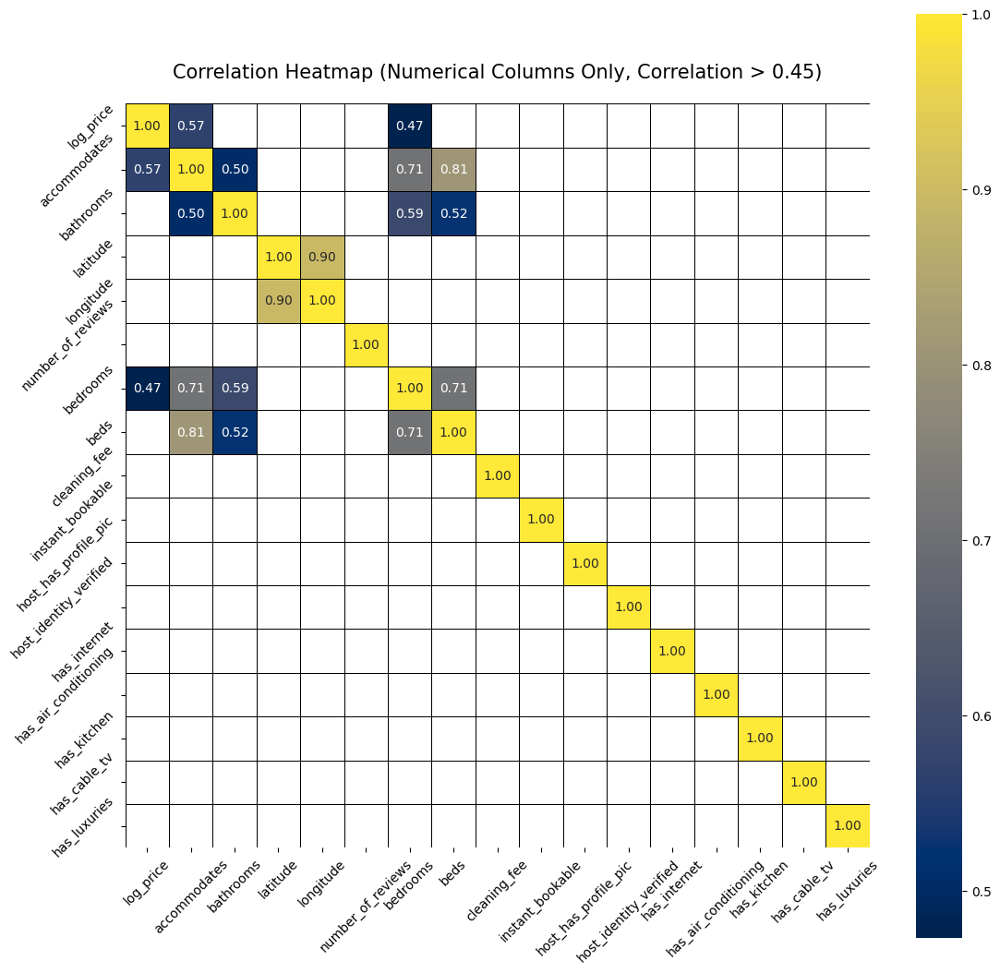

In [34]:
# Creamos la matriz de correlación
correlation_matrix = df_non_categorical.corr()

# Filtramos las correlaciones menores a 0.45
filtered_corr = correlation_matrix[
    (correlation_matrix >= 0.45) | (correlation_matrix <= -0.45)
]

# Creamos el tamaño de la figura
plt.figure(figsize=(13, 13))

# Creamos el mapa de calor de correlación filtrado
sns.heatmap(
    filtered_corr,  # Utilizar la correlación filtrada
    annot=True,  # Mostrar los valores de correlación en las celdas
    cmap="cividis",  # Elegir un esquema de color para el mapa de calor
    fmt=".2f",  # Formato de las anotaciones (dos decimales)
    square=True,  # Hacer que las celdas sean cuadradas
    linewidths=0.5,  # Grosor de las líneas entre las celdas
    linecolor="black",  # Color de las líneas entre las celdas
    annot_kws={"size": 10},  # Ajustar el tamaño de la fuente de las anotaciones
)

# Agregamos título al mapa de calor
plt.title(
    "Correlation Heatmap (Numerical Columns Only, Correlation > 0.45)",
    fontsize=15,
    pad=20,
)

# Rotamos las etiquetas del eje x para una mejor visualización
plt.xticks(rotation=45)

# Rotamos las etiquetas del eje y para una mejor visualización
plt.yticks(rotation=45)

# Mostramos el mapa de calor
plt.show()

Conclusiones

* El precio aumenta a medida que aumenta la capacidad de alojamiento, aunque nos es muy fuerte la relación, se puede decir que a más dormitorios más precio tendrá
* Es evidente que a mayor capacidad de alojamiento, aumenta el número de camas o dormitorios
* A medida que haya más capacidad de alojamiento, más baños, más dormitorios y camas, el precio se verá incrementado

## Nota: Para mayor entendimiento, se exportaran los datasets limpios para ser el input del modelo, el cuál se desarrollará en otro Jupyternotebook para no dejar muy extenso el presente

In [35]:
df_filtered.to_csv("data/df_filtered.csv", index=False)
df_categorical.to_csv("data/df_categorical.csv", index=False)
df_numerical.to_csv("data/df_numerical.csv", index=False)
df_non_categorical.to_csv("data/df_non_categorical.csv", index=False)